### GTZAN Dataset - Music Genre Classification - Individual Project (Yinjie Liu/20211091)

The following is an instance of a README file that allows the others to understand this data structure, some properties and re-run data pre-processing, training, validation and evaluation. 

Download data (and move into project folder): https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification

At first, you have to "pip install" all the required packages in requirements.txt file.
I run my code on the Pycharm(community version), and I use the **tensorflow-gpu package** which means the whole process will be executed on the GPU (if GPU is not available, it will implement on the CPU). However running on the GPU it requires a lot of configuration work.

python3.6.0/ 
keras2.3.1/ 
tensorflow-gpu2.0.0/ 
CUDA10.0.0/ 
cuDNN7.6.0.64 for CUDA10.0

**You have to strictly follow the correct version about five above package since there are bound relationship between them.**

The CUDA installation package, cuDNN files and tensorflow whl file can be find in the directory of venv_python3.6 .

**If you want to run code in the terminal of Pycharm:**  
You have to install CUDA first.
After CUDA installatoion, you need to unzip cuDNN file and remove its file of each directory into corresponding directory of "NVIDIA GPU Computing Toolkit\CUDA\v10.0".  
Execute nvcc -V on your terminal. If successful, the cuda version number will be returned.

**If you want to run code in the jupyter notebook:**  
You have to use "pip install tensorflow_gpu-2.0.0-cp36-cp36m-win_amd64.whl",  
  "conda install cudatoolkit=10.0"  
  and "conda install cudnn"

### Directory Structure
```
Comp47650_Yinjie_Liu_20211091
-checkpoints
   |
    ----> cnn1
    ----> fcnn1
    ----> fcnn2
- Data
    |
     ---> features_3_sec.csv
     ---> features_30_sec.csv
     ---> test.csv
     ---> train.csv
     ---> val.csv
     ---> cnn1_json
        |
        ===> data_10.json
     ---> genres_original
        |
        ===> blues
                .
                . 
                .
        ===> rock    
     ---> images_original
        |
        ===> blues
                .
                . 
                .
        ===> rock

- figs
    |
     ---> cnn1_training_vis.png
     ---> fcnn1_training_vis.png
     ---> fcnn2_training_vis.png   
     ---> PCA_Scattert.png   
- logs
    |
     ---> cnn1
        |
        ---> CNN1_040422_232546.json
     ---> fcnn1
        |
        ---> FCNN1_050422_202621.json
     ---> fcnn2
        |
        ---> FCNN2_050422_203047.json

- models
    |
    ---->__pycache__
        |
        ---> cnn1.cpython-36.pyc
        ---> fcnn1.cpython-36.pyc
        ---> fcnn2.cpython-36.pyc
    ----> cnn1.py
    ----> fcnn1.py
    ----> fcnn2.py
- utils
    |
    ---->__pycache__
        |
        ---> cnn1.cpython-36.pyc
        ---> fcnn1.cpython-36.pyc
        ---> fcnn2.cpython-36.pyc
    ---> Datasets.py
    ---> params.py
    ---> plotting.py
hparams.yaml
main.py
README.html
README.ipynb
requirements.txt
```

At the beginning of the work, I chose to analse this data in detail. Showing the structure of  features_3_sec.csv file and there are 57 properties inside of this data. And then I picked one of them to show its Zoomed audio wave graph, Simple audio waveplot and Principal component analysis on  Music Genres graph amongest ten different labels.

In [3]:
import numpy as np
import pandas as pd
import json
import librosa
from IPython.display import Audio
import librosa.display as lplt
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import sklearn.preprocessing as skp
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

## Data analysis

In [4]:
df = pd.read_csv('Data/features_3_sec.csv')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [5]:
print("As for this Dataset's structure, there are {row} rows and {column} columns".format(row=df.shape[0], column=df.shape[1]))

As for this Dataset's structure, there are 9990 rows and 60 columns


#### Let's see for each type music, how many rows it has.

In [6]:
df.label.value_counts().reset_index()

,index,label
0,reggae,1000
1,pop,1000
2,metal,1000
3,jazz,1000
4,blues,1000
5,disco,999
6,rock,998
7,hiphop,998
8,classical,998
9,country,997


In [7]:
audio_simple = 'Data/genres_original/hiphop/hiphop.00099.wav'
audio_data, sample_rate  = librosa.load(audio_simple)
audio_data, _ = librosa.effects.trim(audio_data)

In [8]:
# play sample file
Audio(audio_data, rate=sample_rate)

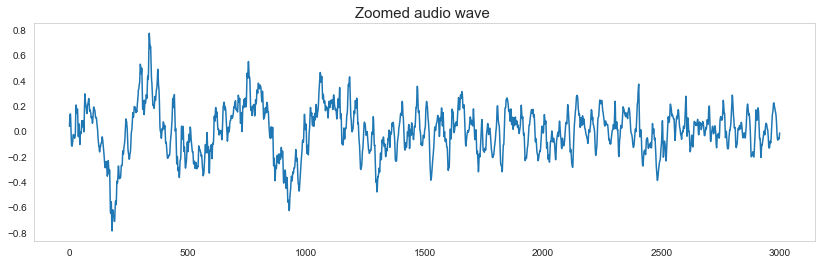

In [9]:
start = 2000
end = 5000
plt.figure(figsize=(14,4))
plt.title("Zoomed audio wave ",fontsize=15)
plt.plot(audio_data[start:end])
plt.grid()
plt.show()

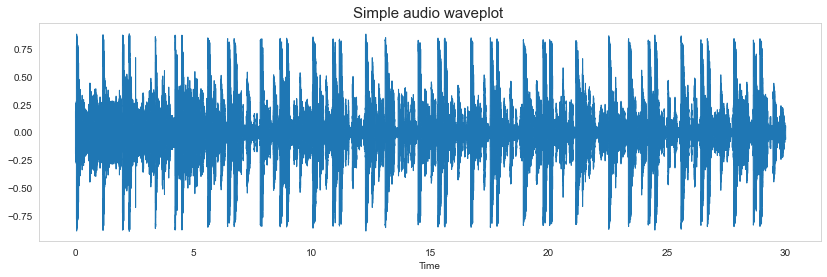

In [10]:
plt.figure(figsize=(14, 4))
plt.title("Simple audio waveplot ",fontsize=15)
plt.grid()
lplt.waveshow(audio_data, sr=sample_rate)
plt.show()

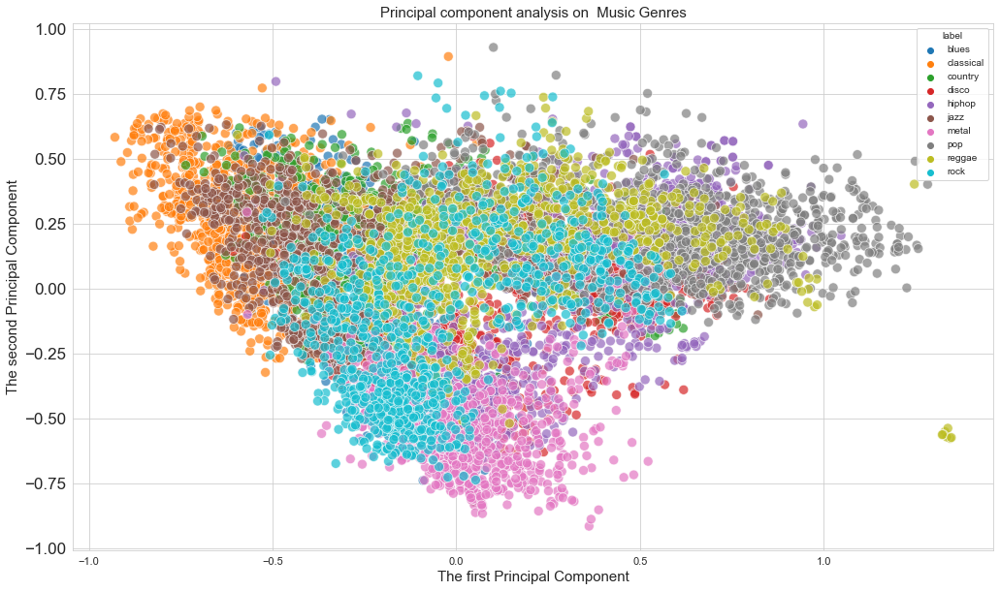

In [11]:
# Principal component analysis

data = df.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']

# normalize the data
cols = X.columns
min_max_scaler = skp.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

# find top 2 pca components

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2'])

# connect with target label
finalDf = pd.concat([principalDf, y], axis = 1)

plt.figure(figsize = (17, 10))
sns.scatterplot(x = "pc1", y = "pc2", data = finalDf, hue = "label", alpha = 0.7, s = 100);

plt.title('Principal component analysis on  Music Genres', fontsize = 15)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 17);
plt.xlabel("The first Principal Component", fontsize = 15)
plt.ylabel("The second Principal Component", fontsize = 15)

plt.savefig("figs/PCA_Scattert.png")

In [12]:
# There is no missing values in the features_3_sec.csv file.
print("Columns with NA values are",list(df.columns[df.isnull().any()]))

Columns with NA values are []


### Training & validation
* In order to write data before running training please set --write_data option to True (False by default). 
* During training, the validation accuracy will be evaluated in order to choose the optimal number of epochs to train models.
* A log file will be generated during training to record validation loss and accuracy for future reference. 

The CNN model firstly came to my mind, and I searched lots of materials how to process audio files.  
The **librosa package** can be used to extract the mcff attribute of a audio file.  
And I saved them in the Data/cnn1_json/data_10.json file which includes each audio file mcff data, its label and each label's directory.

And I used keras to implement a CNN network to train, and its compile parameters can be found in the hparams.yaml file.

### Train CNN model

You can run the  "python main.py CNN1 --write_data True" **in the terminal of Pycharm.(Warning: the right Virtual environment should be venv_python3.6)**

Or you can directly run **! python main.py CNN1 --write_data True** in the jupyter notebook

In [14]:
! python main.py CNN1 --write_data True

F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00000.wav, segment:1
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00000.wav, segment:2
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00000.wav, segment:3
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00000.wav, segment:4
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00000.wav, segment:5
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_2021109

2022-04-11 23:05:53.794042: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library cudart64_100.dll
2022-04-11 23:08:20.828381: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2
2022-04-11 23:08:20.833366: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library nvcuda.dll
2022-04-11 23:08:21.802996: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 23:08:21.803032: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 23:08:21.808235: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 23:08:22.477409: I tensorflow/core/common_runtime/gp

F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00002.wav, segment:5
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00002.wav, segment:6
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00003.wav, segment:1
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00003.wav, segment:2
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00003.wav, segment:3
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_2021109


name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 23:08:22.580836: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 23:08:22.585952: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 23:08:24.104607: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library cublas64_100.dll
2022-04-11 23:08:24.358006: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library cudnn64_7.dll
2022-04-11 23:08:25.300694: W tensorflow/stream_executor/cuda/redzone_allocator.cc:312] Internal: Invoking ptxas not supported on Windows
Relying on driver to perform ptx compilation. This message will be only logged once.
2022-04-11 23:09:22.000737: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: 


F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00021.wav, segment:6
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00022.wav, segment:1
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00022.wav, segment:2
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00022.wav, segment:3
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\blues\blues.00022.wav, segment:4
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_202110

F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00006.wav, segment:3
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00006.wav, segment:4
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00006.wav, segment:5
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00006.wav, segment:6
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00007.wav, segment:1
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp4765

F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00042.wav, segment:2
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00042.wav, segment:3
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00042.wav, segment:4
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00042.wav, segment:5
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\country\country.00042.wav, segment:6
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp4765

F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00005.wav, segment:4
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00005.wav, segment:5
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00005.wav, segment:6
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00006.wav, segment:1
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00006.wav, segment:2
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_L

F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00048.wav, segment:1
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00048.wav, segment:2
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00048.wav, segment:3
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00048.wav, segment:4
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\hiphop\hiphop.00048.wav, segment:5
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_L

F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00020.wav, segment:5
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00020.wav, segment:6
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00021.wav, segment:1
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00021.wav, segment:2
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00021.wav, segment:3
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_origin

F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00044.wav, segment:6
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00045.wav, segment:1
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00045.wav, segment:2
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00045.wav, segment:3
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_original\pop\pop.00045.wav, segment:4
F:\Study_content\UCD\zSemester2\jupyter_notebook\COMP47650.Deep_learning\Individual_Project\Comp47650_Yinjie_Liu_20211091\Data\genres_origin

3595/3595 [==============================] - 2s 509us/sample - loss: 1.8911 - accuracy: 0.3491 - val_loss: 1.6867 - val_accuracy: 0.3971
Epoch 3/30

3595/3595 [==============================] - 2s 504us/sample - loss: 1.6975 - accuracy: 0.4120 - val_loss: 1.4911 - val_accuracy: 0.4650
Epoch 4/30

3595/3595 [==============================] - 2s 509us/sample - loss: 1.5589 - accuracy: 0.4437 - val_loss: 1.3729 - val_accuracy: 0.5050
Epoch 5/30

3595/3595 [==============================] - 2s 513us/sample - loss: 1.4155 - accuracy: 0.4887 - val_loss: 1.3245 - val_accuracy: 0.5217
Epoch 6/30

3595/3595 [==============================] - 2s 504us/sample - loss: 1.3252 - accuracy: 0.5246 - val_loss: 1.2506 - val_accuracy: 0.5428
Epoch 7/30

3595/3595 [==============================] - 2s 509us/sample - loss: 1.2561 - accuracy: 0.5477 - val_loss: 1.2072 - val_accuracy: 0.5473
Epoch 8/30

3168/3595 [=========================>....] - ETA: 0s - loss: 1.2077 - accuracy: 0.5631

3595/3595 [==============================] - 2s 529us/sample - loss: 1.2106 - accuracy: 0.5622 - val_loss: 1.1690 - val_accuracy: 0.5829
Epoch 9/30

3595/3595 [==============================] - 2s 513us/sample - loss: 1.1627 - accuracy: 0.5780 - val_loss: 1.1431 - val_accuracy: 0.5907
Epoch 10/30

3595/3595 [==============================] - 2s 517us/sample - loss: 1.1099 - accuracy: 0.5961 - val_loss: 1.1508 - val_accuracy: 0.5829
Epoch 11/30

3595/3595 [==============================] - 2s 522us/sample - loss: 1.0742 - accuracy: 0.6186 - val_loss: 1.0907 - val_accuracy: 0.6040
Epoch 12/30

3595/3595 [==============================] - 2s 513us/sample - loss: 1.0164 - accuracy: 0.6392 - val_loss: 1.0848 - val_accuracy: 0.6129
Epoch 13/30

3595/3595 [==============================] - 2s 526us/sample - loss: 0.9861 - accuracy: 0.6442 - val_loss: 1.0648 - val_accuracy: 0.6151
Epoch 14/30

3595/3595 [==============================] - 2s 517us/sample - loss: 0.9573 - accuracy: 0.6567 - val_

And then I found this model accuracy was not ideal enough, so I then directly to process features_3_sec data file and use fcnn(fully connected neural network) to train. And I split data into training data(70%), valid data(20%) and test data(10%).

### Train FCNN models

You can run the "python main.py FCNN1 --write_data True" **in the terminal of Pycharm.(Warning: the right Virtual environment should be venv_python3.6)** And you will get result as below shown.  

Or you can directly run **! python main.py FCNN1 --write_data True** in the jupyter notebook

In [15]:
! python main.py FCNN1 --write_data True

Columns with NA values are [] which means there is no missing value!
Dataset is being processed right now......

Train set has 6993 records out of 9990 which is 70%
Dev set has 1978 records out of 9990 which is 20%
Test set has 1019 records out of 9990 which is 10%



Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               14848     
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_3 (Dense)              (None, 10)                650       
Total params: 56,650
Trainable params: 56,650
Non-trainable params: 0
_______________________________________________

2022-04-11 23:12:43.820341: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library cudart64_100.dll
2022-04-11 23:12:49.868419: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2
2022-04-11 23:12:49.873070: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library nvcuda.dll
2022-04-11 23:12:49.966206: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 23:12:49.966230: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 23:12:49.971233: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 23:12:50.621240: I tensorflow/core/common_runtime/gp

6993/6993 [==============================] - 1s 74us/sample - loss: 1.4861 - accuracy: 0.4710 - val_loss: 1.0799 - val_accuracy: 0.6213
Epoch 2/70

6993/6993 [==============================] - 0s 25us/sample - loss: 0.9098 - accuracy: 0.6900 - val_loss: 0.8380 - val_accuracy: 0.7139
Epoch 3/70

6993/6993 [==============================] - 0s 25us/sample - loss: 0.7027 - accuracy: 0.7681 - val_loss: 0.7158 - val_accuracy: 0.7457
Epoch 4/70

6993/6993 [==============================] - 0s 25us/sample - loss: 0.5767 - accuracy: 0.8081 - val_loss: 0.6561 - val_accuracy: 0.7700
Epoch 5/70

6993/6993 [==============================] - 0s 25us/sample - loss: 0.4862 - accuracy: 0.8431 - val_loss: 0.5961 - val_accuracy: 0.7942
Epoch 6/70

6993/6993 [==============================] - 0s 25us/sample - loss: 0.4212 - accuracy: 0.8606 - val_loss: 0.5533 - val_accuracy: 0.8038
Epoch 7/70

6993/6993 [==============================] - 0s 25us/sample - loss: 0.3539 - accuracy: 0.8873 - val_loss: 0.5019

6993/6993 [==============================] - 0s 27us/sample - loss: 0.0229 - accuracy: 0.9981 - val_loss: 0.4063 - val_accuracy: 0.8837
Epoch 24/70

6993/6993 [==============================] - 0s 29us/sample - loss: 0.0198 - accuracy: 0.9984 - val_loss: 0.4103 - val_accuracy: 0.8847
Epoch 25/70

6993/6993 [==============================] - 0s 27us/sample - loss: 0.0191 - accuracy: 0.9979 - val_loss: 0.4226 - val_accuracy: 0.8802
Epoch 26/70

6993/6993 [==============================] - 0s 27us/sample - loss: 0.0208 - accuracy: 0.9974 - val_loss: 0.4175 - val_accuracy: 0.8852
Epoch 27/70

6993/6993 [==============================] - 0s 27us/sample - loss: 0.0146 - accuracy: 0.9990 - val_loss: 0.4080 - val_accuracy: 0.8878
Epoch 28/70

6993/6993 [==============================] - 0s 29us/sample - loss: 0.0126 - accuracy: 0.9989 - val_loss: 0.4287 - val_accuracy: 0.8837
Epoch 29/70

6993/6993 [==============================] - 0s 27us/sample - loss: 0.0149 - accuracy: 0.9977 - val_loss: 

As we can see from above result, the accuracy reaches more than 90%, but I try to build another fcnn model which is more complicated and there will be dropout layer after each fully connected layer. Also I add the dimensionality in this model.

You can run the "python main.py FCNN2" **in the terminal of Pycharm.(Warning: the right Virtual environment should be venv_python3.6)** And you will get result as below shown.  

Or you can directly run **! python main.py FCNN2** in the jupyter notebook

In [16]:
! python main.py FCNN2

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1024)              59392     
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               3

2022-04-11 23:18:34.507205: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library cudart64_100.dll
2022-04-11 23:18:39.556934: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2
2022-04-11 23:18:39.561356: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library nvcuda.dll
2022-04-11 23:18:40.534244: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 23:18:40.534289: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 23:18:40.541936: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 23:18:41.216058: I tensorflow/core/common_runtime/gp

Total params: 757,322
Trainable params: 757,322
Non-trainable params: 0
_________________________________________________________________
Train on 6993 samples, validate on 1978 samples
Epoch 1/500

6993/6993 [==============================] - 1s 160us/sample - loss: 1.6905 - accuracy: 0.3955 - val_loss: 1.1817 - val_accuracy: 0.5905
Epoch 2/500

6993/6993 [==============================] - 1s 76us/sample - loss: 1.2492 - accuracy: 0.5671 - val_loss: 0.9574 - val_accuracy: 0.6775
Epoch 3/500

6993/6993 [==============================] - 1s 74us/sample - loss: 1.0309 - accuracy: 0.6602 - val_loss: 0.8278 - val_accuracy: 0.7235
Epoch 4/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.9010 - accuracy: 0.7046 - val_loss: 0.7394 - val_accuracy: 0.7568
Epoch 5/500

6993/6993 [==============================] - 1s 76us/sample - loss: 0.7974 - accuracy: 0.7407 - val_loss: 0.7494 - val_accuracy: 0.7513
Epoch 6/500

6993/6993 [==============================] - 0s 71us/sa


2022-04-11 23:23:35.375269: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-04-11 23:23:35.375281: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      0 
2022-04-11 23:23:35.375287: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1178] 0:   N 
2022-04-11 23:23:35.381930: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1304] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 4846 MB memory) -> physical GPU (device: 0, name: GeForce GTX 1060, pci bus id: 0000:01:00.0, compute capability: 6.1)
2022-04-11 23:23:36.897565: W tensorflow/python/util/util.cc:299] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.



6993/6993 [==============================] - 1s 80us/sample - loss: 0.6286 - accuracy: 0.8004 - val_loss: 0.6136 - val_accuracy: 0.8109
Epoch 8/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.5601 - accuracy: 0.8235 - val_loss: 0.5208 - val_accuracy: 0.8372
Epoch 9/500

6993/6993 [==============================] - 1s 89us/sample - loss: 0.5077 - accuracy: 0.8408 - val_loss: 0.4910 - val_accuracy: 0.8448
Epoch 10/500

6993/6993 [==============================] - 1s 84us/sample - loss: 0.4825 - accuracy: 0.8488 - val_loss: 0.5151 - val_accuracy: 0.8433
Epoch 11/500

6993/6993 [==============================] - 1s 82us/sample - loss: 0.4452 - accuracy: 0.8623 - val_loss: 0.4728 - val_accuracy: 0.8473
Epoch 12/500

6993/6993 [==============================] - 1s 77us/sample - loss: 0.3866 - accuracy: 0.8779 - val_loss: 0.4821 - val_accuracy: 0.8554
Epoch 13/500

6993/6993 [==============================] - 1s 74us/sample - loss: 0.3786 - accuracy: 0.8867 - val_l

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0881 - accuracy: 0.9834 - val_loss: 0.4720 - val_accuracy: 0.9282
Epoch 104/500

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0639 - accuracy: 0.9844 - val_loss: 0.5759 - val_accuracy: 0.9242
Epoch 105/500

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0801 - accuracy: 0.9826 - val_loss: 0.5077 - val_accuracy: 0.9302
Epoch 106/500

6993/6993 [==============================] - 1s 82us/sample - loss: 0.0682 - accuracy: 0.9868 - val_loss: 0.6182 - val_accuracy: 0.9242
Epoch 107/500

6993/6993 [==============================] - 1s 79us/sample - loss: 0.0668 - accuracy: 0.9850 - val_loss: 0.5797 - val_accuracy: 0.9257
Epoch 108/500

6993/6993 [==============================] - 1s 79us/sample - loss: 0.0705 - accuracy: 0.9834 - val_loss: 0.5711 - val_accuracy: 0.9277
Epoch 109/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0661 - accuracy: 0.9853 

Epoch 123/500

6993/6993 [==============================] - 1s 81us/sample - loss: 0.0697 - accuracy: 0.9861 - val_loss: 0.6047 - val_accuracy: 0.9237
Epoch 124/500

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0677 - accuracy: 0.9874 - val_loss: 0.6533 - val_accuracy: 0.9267
Epoch 125/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0852 - accuracy: 0.9850 - val_loss: 0.6307 - val_accuracy: 0.9181
Epoch 126/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0630 - accuracy: 0.9867 - val_loss: 0.6075 - val_accuracy: 0.9262
Epoch 127/500

6993/6993 [==============================] - 1s 79us/sample - loss: 0.0809 - accuracy: 0.9863 - val_loss: 0.7272 - val_accuracy: 0.9257
Epoch 128/500

6993/6993 [==============================] - 1s 82us/sample - loss: 0.0991 - accuracy: 0.9843 - val_loss: 0.5793 - val_accuracy: 0.9292
Epoch 129/500

6993/6993 [==============================] - 1s 89us/sample - loss: 0.0870 - ac

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0949 - accuracy: 0.9833 - val_loss: 0.5286 - val_accuracy: 0.9151
Epoch 133/500

6993/6993 [==============================] - 1s 85us/sample - loss: 0.0884 - accuracy: 0.9847 - val_loss: 0.5728 - val_accuracy: 0.9216
Epoch 134/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0878 - accuracy: 0.9854 - val_loss: 0.5935 - val_accuracy: 0.9206
Epoch 135/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0624 - accuracy: 0.9867 - val_loss: 0.6847 - val_accuracy: 0.9191
Epoch 136/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0698 - accuracy: 0.9883 - val_loss: 0.5785 - val_accuracy: 0.9277
Epoch 137/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0901 - accuracy: 0.9830 - val_loss: 0.5183 - val_accuracy: 0.9323
Epoch 138/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0597 - accuracy: 0.9886 

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0704 - accuracy: 0.9898 - val_loss: 0.7967 - val_accuracy: 0.9307
Epoch 210/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0999 - accuracy: 0.9870 - val_loss: 0.9585 - val_accuracy: 0.9262
Epoch 211/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.1267 - accuracy: 0.9866 - val_loss: 0.7125 - val_accuracy: 0.9257
Epoch 212/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0732 - accuracy: 0.9888 - val_loss: 0.7869 - val_accuracy: 0.9232
Epoch 213/500

6993/6993 [==============================] - 1s 81us/sample - loss: 0.0763 - accuracy: 0.9880 - val_loss: 0.7700 - val_accuracy: 0.9242
Epoch 214/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0744 - accuracy: 0.9883 - val_loss: 0.8319 - val_accuracy: 0.9232
Epoch 215/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0984 - accuracy: 0.9856 


6993/6993 [==============================] - 1s 80us/sample - loss: 0.0812 - accuracy: 0.9907 - val_loss: 1.0153 - val_accuracy: 0.9292
Epoch 225/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0938 - accuracy: 0.9876 - val_loss: 1.0687 - val_accuracy: 0.9201
Epoch 226/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0862 - accuracy: 0.9877 - val_loss: 0.8803 - val_accuracy: 0.9292
Epoch 227/500

6993/6993 [==============================] - 1s 93us/sample - loss: 0.0987 - accuracy: 0.9866 - val_loss: 0.8624 - val_accuracy: 0.9317
Epoch 228/500

6993/6993 [==============================] - 1s 77us/sample - loss: 0.0680 - accuracy: 0.9896 - val_loss: 0.8387 - val_accuracy: 0.9348
Epoch 229/500

6993/6993 [==============================] - 1s 77us/sample - loss: 0.0651 - accuracy: 0.9883 - val_loss: 0.9729 - val_accuracy: 0.9272
Epoch 230/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0625 - accuracy: 0.9910

6993/6993 [==============================] - 1s 85us/sample - loss: 0.1019 - accuracy: 0.9888 - val_loss: 0.9400 - val_accuracy: 0.9317
Epoch 242/500

6993/6993 [==============================] - 1s 82us/sample - loss: 0.0885 - accuracy: 0.9876 - val_loss: 1.1124 - val_accuracy: 0.9247
Epoch 243/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.1042 - accuracy: 0.9888 - val_loss: 0.8708 - val_accuracy: 0.9378
Epoch 244/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0943 - accuracy: 0.9874 - val_loss: 0.9445 - val_accuracy: 0.9317
Epoch 245/500

6993/6993 [==============================] - 1s 81us/sample - loss: 0.0845 - accuracy: 0.9876 - val_loss: 0.8084 - val_accuracy: 0.9302
Epoch 246/500

6993/6993 [==============================] - 1s 87us/sample - loss: 0.0748 - accuracy: 0.9896 - val_loss: 0.8490 - val_accuracy: 0.9312
Epoch 247/500

6993/6993 [==============================] - 1s 84us/sample - loss: 0.1311 - accuracy: 0.9880 

6993/6993 [==============================] - 1s 82us/sample - loss: 0.0973 - accuracy: 0.9903 - val_loss: 1.2721 - val_accuracy: 0.9237
Epoch 289/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.1591 - accuracy: 0.9856 - val_loss: 0.9968 - val_accuracy: 0.9292
Epoch 290/500

6993/6993 [==============================] - 1s 81us/sample - loss: 0.1016 - accuracy: 0.9886 - val_loss: 1.0796 - val_accuracy: 0.9267
Epoch 291/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0613 - accuracy: 0.9918 - val_loss: 1.0727 - val_accuracy: 0.9333
Epoch 292/500

6993/6993 [==============================] - 1s 87us/sample - loss: 0.1018 - accuracy: 0.9877 - val_loss: 1.0638 - val_accuracy: 0.9302
Epoch 293/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0733 - accuracy: 0.9883 - val_loss: 0.9681 - val_accuracy: 0.9312
Epoch 294/500

6993/6993 [==============================] - 1s 81us/sample - loss: 0.0841 - accuracy: 0.9896 

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0913 - accuracy: 0.9880 - val_loss: 0.8705 - val_accuracy: 0.9353
Epoch 296/500

6993/6993 [==============================] - 1s 97us/sample - loss: 0.0688 - accuracy: 0.9883 - val_loss: 0.9912 - val_accuracy: 0.9307
Epoch 297/500

6993/6993 [==============================] - 1s 86us/sample - loss: 0.0919 - accuracy: 0.9883 - val_loss: 0.9395 - val_accuracy: 0.9312
Epoch 298/500

6993/6993 [==============================] - 1s 79us/sample - loss: 0.1180 - accuracy: 0.9883 - val_loss: 1.3850 - val_accuracy: 0.9242
Epoch 299/500

6993/6993 [==============================] - 1s 77us/sample - loss: 0.1363 - accuracy: 0.9848 - val_loss: 1.0944 - val_accuracy: 0.9312
Epoch 300/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0758 - accuracy: 0.9898 - val_loss: 1.1236 - val_accuracy: 0.9257
Epoch 301/500

6993/6993 [==============================] - 1s 100us/sample - loss: 0.0767 - accuracy: 0.9898

6993/6993 [==============================] - 1s 89us/sample - loss: 0.0947 - accuracy: 0.9878 - val_loss: 1.2402 - val_accuracy: 0.9247
Epoch 315/500

6993/6993 [==============================] - 1s 89us/sample - loss: 0.1117 - accuracy: 0.9890 - val_loss: 1.1279 - val_accuracy: 0.9297
Epoch 316/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.1093 - accuracy: 0.9900 - val_loss: 1.1989 - val_accuracy: 0.9287
Epoch 317/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0686 - accuracy: 0.9908 - val_loss: 1.2131 - val_accuracy: 0.9292
Epoch 318/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.1190 - accuracy: 0.9906 - val_loss: 1.2000 - val_accuracy: 0.9272
Epoch 319/500

6993/6993 [==============================] - 1s 93us/sample - loss: 0.0883 - accuracy: 0.9907 - val_loss: 1.1461 - val_accuracy: 0.9282
Epoch 320/500

6993/6993 [==============================] - 1s 79us/sample - loss: 0.0959 - accuracy: 0.9901 

6993/6993 [==============================] - 1s 88us/sample - loss: 0.0761 - accuracy: 0.9880 - val_loss: 1.3294 - val_accuracy: 0.9368
Epoch 389/500

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0897 - accuracy: 0.9894 - val_loss: 1.4087 - val_accuracy: 0.9323
Epoch 390/500

6993/6993 [==============================] - 1s 85us/sample - loss: 0.0993 - accuracy: 0.9901 - val_loss: 1.3271 - val_accuracy: 0.9343
Epoch 391/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0873 - accuracy: 0.9908 - val_loss: 1.4981 - val_accuracy: 0.9333
Epoch 392/500

6993/6993 [==============================] - 1s 96us/sample - loss: 0.0892 - accuracy: 0.9920 - val_loss: 1.5861 - val_accuracy: 0.9312
Epoch 393/500

6993/6993 [==============================] - 1s 95us/sample - loss: 0.1407 - accuracy: 0.9881 - val_loss: 1.3058 - val_accuracy: 0.9363
Epoch 394/500

6993/6993 [==============================] - 1s 83us/sample - loss: 0.1290 - accuracy: 0.9897 

6993/6993 [==============================] - 1s 100us/sample - loss: 0.1149 - accuracy: 0.9891 - val_loss: 1.4253 - val_accuracy: 0.9368
Epoch 400/500

6993/6993 [==============================] - 1s 83us/sample - loss: 0.1173 - accuracy: 0.9906 - val_loss: 1.3764 - val_accuracy: 0.9302
Epoch 401/500

6993/6993 [==============================] - 1s 105us/sample - loss: 0.0998 - accuracy: 0.9898 - val_loss: 1.3006 - val_accuracy: 0.9312
Epoch 402/500

6993/6993 [==============================] - 1s 87us/sample - loss: 0.1432 - accuracy: 0.9878 - val_loss: 1.2487 - val_accuracy: 0.9333
Epoch 403/500

6993/6993 [==============================] - 1s 98us/sample - loss: 0.0834 - accuracy: 0.9908 - val_loss: 1.5340 - val_accuracy: 0.9312
Epoch 404/500

6993/6993 [==============================] - 1s 85us/sample - loss: 0.0826 - accuracy: 0.9923 - val_loss: 1.5907 - val_accuracy: 0.9338
Epoch 405/500

6993/6993 [==============================] - 1s 101us/sample - loss: 0.1219 - accuracy: 0.98

6993/6993 [==============================] - 1s 80us/sample - loss: 0.1489 - accuracy: 0.9884 - val_loss: 1.3614 - val_accuracy: 0.9323
Epoch 414/500

6993/6993 [==============================] - 1s 91us/sample - loss: 0.0660 - accuracy: 0.9921 - val_loss: 1.5035 - val_accuracy: 0.9328
Epoch 415/500

6993/6993 [==============================] - 1s 87us/sample - loss: 0.1262 - accuracy: 0.9918 - val_loss: 1.4912 - val_accuracy: 0.9353
Epoch 416/500

6993/6993 [==============================] - 1s 94us/sample - loss: 0.1274 - accuracy: 0.9904 - val_loss: 1.2104 - val_accuracy: 0.9368
Epoch 417/500

6993/6993 [==============================] - 1s 79us/sample - loss: 0.1172 - accuracy: 0.9881 - val_loss: 1.1330 - val_accuracy: 0.9378
Epoch 418/500

6993/6993 [==============================] - 1s 82us/sample - loss: 0.1173 - accuracy: 0.9877 - val_loss: 1.1653 - val_accuracy: 0.9328
Epoch 419/500

6993/6993 [==============================] - 1s 95us/sample - loss: 0.1088 - accuracy: 0.9873 


6993/6993 [==============================] - 1s 92us/sample - loss: 0.0938 - accuracy: 0.9891 - val_loss: 1.6481 - val_accuracy: 0.9317
Epoch 453/500

6993/6993 [==============================] - 1s 94us/sample - loss: 0.1416 - accuracy: 0.9876 - val_loss: 1.7736 - val_accuracy: 0.9348
Epoch 454/500

6993/6993 [==============================] - 1s 92us/sample - loss: 0.1096 - accuracy: 0.9906 - val_loss: 1.6955 - val_accuracy: 0.9343
Epoch 455/500

6993/6993 [==============================] - 1s 99us/sample - loss: 0.1682 - accuracy: 0.9886 - val_loss: 1.4014 - val_accuracy: 0.9307
Epoch 456/500

6993/6993 [==============================] - 1s 100us/sample - loss: 0.0853 - accuracy: 0.9913 - val_loss: 1.6952 - val_accuracy: 0.9343
Epoch 457/500

6993/6993 [==============================] - 1s 101us/sample - loss: 0.0775 - accuracy: 0.9903 - val_loss: 1.6549 - val_accuracy: 0.9287
Epoch 458/500

6993/6993 [==============================] - 1s 105us/sample - loss: 0.0974 - accuracy: 0.9

6993/6993 [==============================] - 1s 81us/sample - loss: 0.0881 - accuracy: 0.9910 - val_loss: 1.5577 - val_accuracy: 0.9312
Epoch 466/500

6993/6993 [==============================] - 1s 84us/sample - loss: 0.0568 - accuracy: 0.9923 - val_loss: 2.0684 - val_accuracy: 0.9338
Epoch 467/500

6993/6993 [==============================] - 1s 83us/sample - loss: 0.2106 - accuracy: 0.9906 - val_loss: 1.9018 - val_accuracy: 0.9262
Epoch 468/500

6993/6993 [==============================] - 1s 83us/sample - loss: 0.1179 - accuracy: 0.9914 - val_loss: 1.5693 - val_accuracy: 0.9328
Epoch 469/500

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0658 - accuracy: 0.9901 - val_loss: 1.7847 - val_accuracy: 0.9272
Epoch 470/500

6993/6993 [==============================] - 1s 79us/sample - loss: 0.1421 - accuracy: 0.9881 - val_loss: 1.4533 - val_accuracy: 0.9343
Epoch 471/500

6993/6993 [==============================] - 1s 81us/sample - loss: 0.1107 - accuracy: 0.9896 

6993/6993 [==============================] - 1s 78us/sample - loss: 0.1004 - accuracy: 0.9907 - val_loss: 1.3892 - val_accuracy: 0.9328
Epoch 475/500

6993/6993 [==============================] - 1s 81us/sample - loss: 0.1056 - accuracy: 0.9918 - val_loss: 1.5230 - val_accuracy: 0.9323
Epoch 476/500

6993/6993 [==============================] - 1s 86us/sample - loss: 0.0834 - accuracy: 0.9901 - val_loss: 1.4390 - val_accuracy: 0.9297
Epoch 477/500

6993/6993 [==============================] - 1s 79us/sample - loss: 0.0797 - accuracy: 0.9894 - val_loss: 1.5264 - val_accuracy: 0.9338
Epoch 478/500

6993/6993 [==============================] - 1s 87us/sample - loss: 0.0861 - accuracy: 0.9910 - val_loss: 1.5572 - val_accuracy: 0.9312
Epoch 479/500

6993/6993 [==============================] - 1s 85us/sample - loss: 0.1016 - accuracy: 0.9890 - val_loss: 1.6269 - val_accuracy: 0.9323
Epoch 480/500

6993/6993 [==============================] - 1s 87us/sample - loss: 0.1298 - accuracy: 0.9911 

And I set the epochs as 500 and use rmsprop optimizer, and finally get more than **93% accuracy** for this model.

## Lets take a look at the validation performance for these three models

In [17]:
def plot_history(train_losses, train_accs, val_losses, val_accs, model_name="", return_fig=True):
    fig, axs = plt.subplots(2, figsize=(15, 10))

    axs[0].plot(train_accs, label="train accuracy")
    axs[0].plot(val_accs, label="valid accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy eval for " + model_name)

    axs[1].plot(train_losses, label="train error")
    axs[1].plot(val_losses, label="valid error")
    axs[1].set_ylabel("Error")
    axs[1].set_xlabel("Epoch")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Error eval for " + model_name)

    fig.tight_layout()

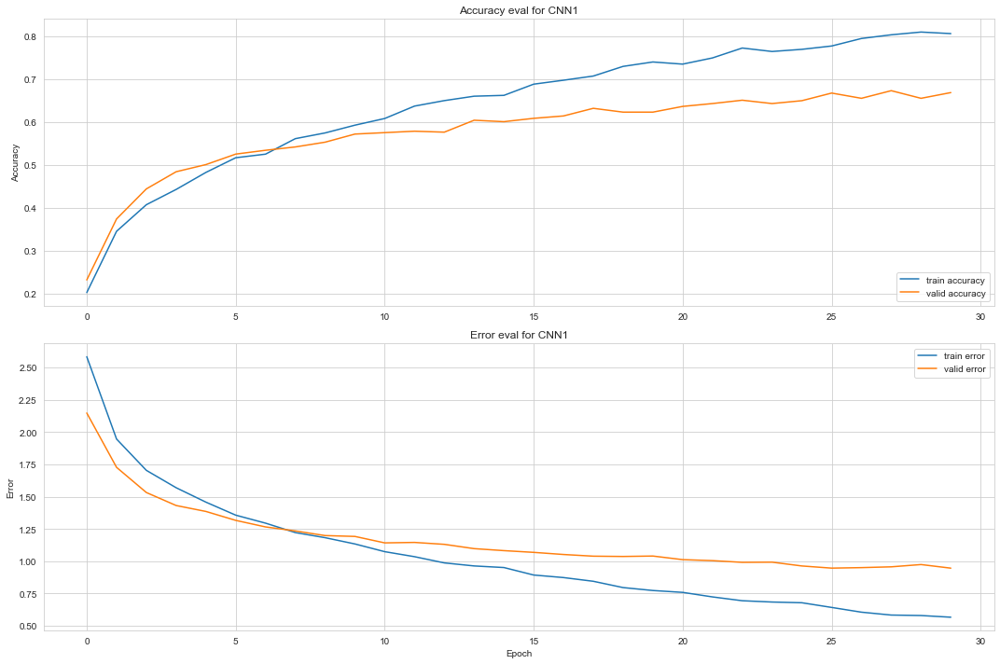

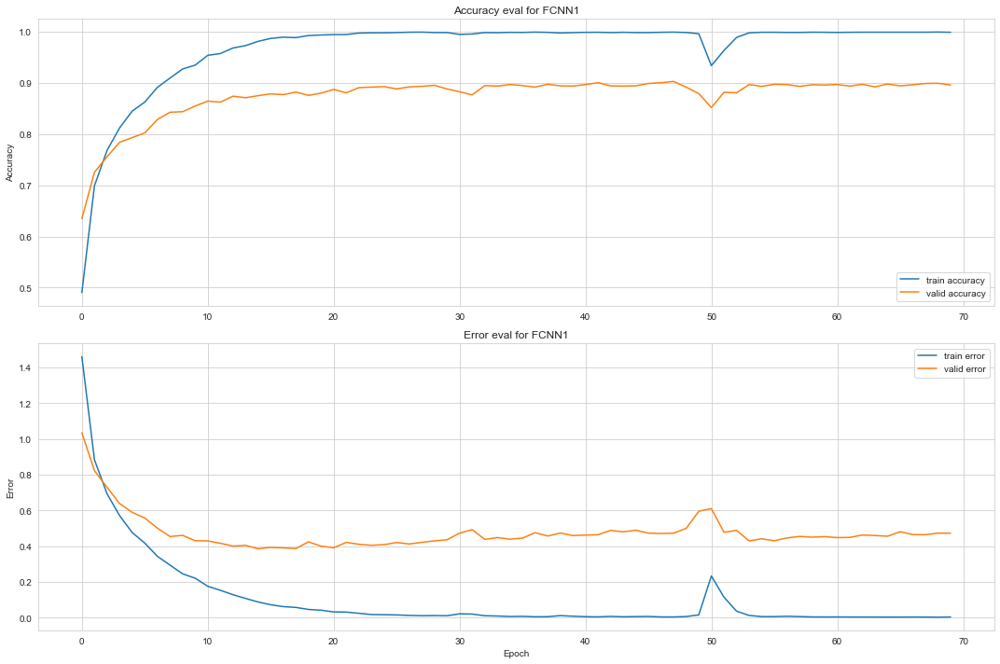

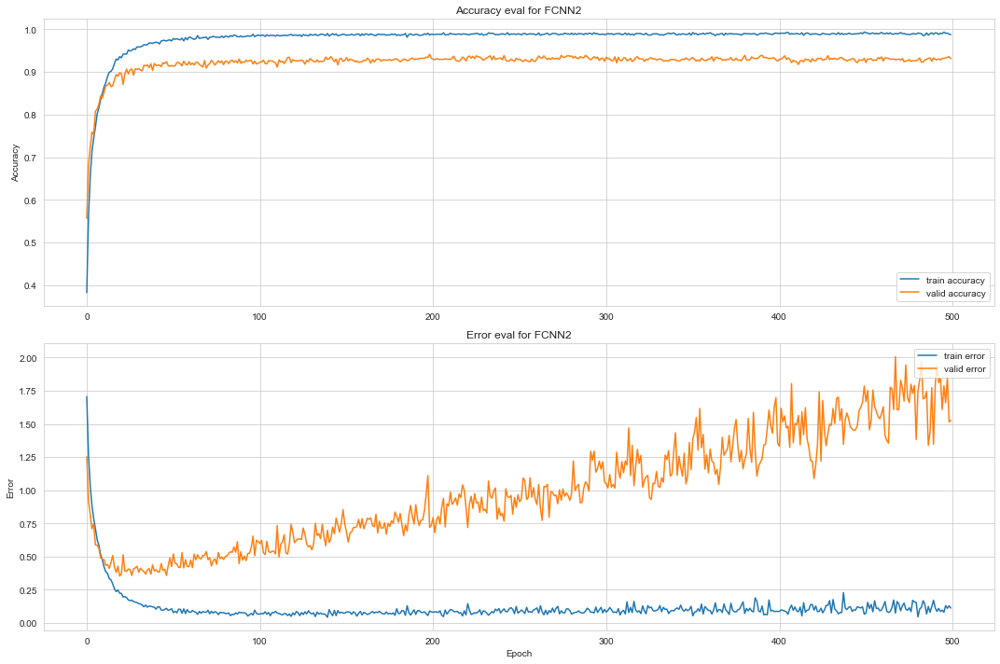

In [18]:
import json
%matplotlib inline

cnn1_val_log = "logs/cnn1/CNN1_060422_122834.json"
fcnn1_val_log = "logs/fcnn1/FCNN1_060422_124733.json"
fcnn2_val_log = "logs/fcnn2/FCNN2_060422_125313.json"

with open(cnn1_val_log, 'r') as cnn1:
    cnn1_val_json = json.load(cnn1)
with open(fcnn1_val_log, 'r') as fcnn1:
    fcnn1_val_json = json.load(fcnn1)
with open(fcnn2_val_log, 'r') as fcnn2:
    fcnn2_val_json = json.load(fcnn2)
    
plot_history(cnn1_val_json["train_losses"],
              cnn1_val_json["train_accs"],
              cnn1_val_json["val_losses"], 
              cnn1_val_json["val_accs"],
              model_name="CNN1")

plot_history(fcnn1_val_json["train_losses"],
              fcnn1_val_json["train_accs"],
              fcnn1_val_json["val_losses"], 
              fcnn1_val_json["val_accs"],
              model_name="FCNN1")

plot_history(fcnn2_val_json["train_losses"],
              fcnn2_val_json["train_accs"],
              fcnn2_val_json["val_losses"], 
              fcnn2_val_json["val_accs"],
              model_name="FCNN2")

You can run the "python eval.py logs/cnn1/CNN1_060422_122834.json 5" **in the terminal of Pycharm.(Warning: the right Virtual environment should be venv_python3.6)** And you will get result as below shown.  

Or you can directly run **! python eval.py logs/cnn1/CNN1_060422_122834.json 5** in the jupyter notebook

In [2]:
! python eval.py logs/cnn1/CNN1_060422_122834.json 5

Training model for iteration 0...
Train on 3595 samples, validate on 899 samples
Epoch 1/28

3595/3595 [==============================] - 4s 1ms/sample - loss: 2.4199 - accuracy: 0.2225 - val_loss: 2.0674 - val_accuracy: 0.2636
Epoch 2/28

1984/3595 [===============>..............] - ETA: 0s - loss: 1.9371 - accuracy: 0.3407

2022-04-11 22:22:57.101545: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library cudart64_100.dll
2022-04-11 22:23:16.420593: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2
2022-04-11 22:23:16.425999: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library nvcuda.dll
2022-04-11 22:23:16.532635: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 22:23:16.532665: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 22:23:16.538517: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 22:23:17.264519: I tensorflow/core/common_runtime/gp


3595/3595 [==============================] - 2s 537us/sample - loss: 1.8815 - accuracy: 0.3510 - val_loss: 1.6561 - val_accuracy: 0.4116
Epoch 3/28

3595/3595 [==============================] - 2s 439us/sample - loss: 1.6596 - accuracy: 0.4147 - val_loss: 1.4787 - val_accuracy: 0.4538
Epoch 4/28

1600/3595 [============>.................] - ETA: 0s - loss: 1.5606 - accuracy: 0.4387



name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 22:25:18.106398: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 22:25:18.112220: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 22:25:18.112291: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-04-11 22:25:18.112301: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      0 
2022-04-11 22:25:18.112307: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1178] 0:   N 
2022-04-11 22:25:18.118144: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1304] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 4846 MB memory) -> physical GPU (device: 0, name: GeForce GTX 1060, pci bus id: 0000:01:00.0, compute capability: 6.1)
2022-04-11 22:26:1

3595/3595 [==============================] - 2s 465us/sample - loss: 1.5333 - accuracy: 0.4512 - val_loss: 1.3989 - val_accuracy: 0.4705
Epoch 5/28

3595/3595 [==============================] - 2s 532us/sample - loss: 1.4390 - accuracy: 0.4871 - val_loss: 1.3385 - val_accuracy: 0.4950
Epoch 6/28

3595/3595 [==============================] - 2s 522us/sample - loss: 1.3467 - accuracy: 0.5135 - val_loss: 1.2686 - val_accuracy: 0.5172
Epoch 7/28

3595/3595 [==============================] - 2s 488us/sample - loss: 1.2907 - accuracy: 0.5438 - val_loss: 1.2292 - val_accuracy: 0.5473
Epoch 8/28

3595/3595 [==============================] - 2s 513us/sample - loss: 1.2497 - accuracy: 0.5488 - val_loss: 1.1831 - val_accuracy: 0.5628
Epoch 9/28

3595/3595 [==============================] - 2s 488us/sample - loss: 1.2153 - accuracy: 0.5661 - val_loss: 1.1730 - val_accuracy: 0.5840
Epoch 10/28

3595/3595 [==============================] - 2s 530us/sample - loss: 1.1630 - accuracy: 0.5744 - val_loss

2022-04-11 22:27:23.768825: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 22:27:23.774662: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 22:27:23.774736: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-04-11 22:27:23.774746: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      0 
2022-04-11 22:27:23.774752: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1178] 0:   N 
2022-04-11 22:27:23.780928: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1304] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 4846 MB memory) -> physical GPU (device: 0, name: GeForce GTX 1060, pci bus id: 0000:01:00.0, compute capability: 6.1)


3595/3595 [==============================] - 2s 543us/sample - loss: 0.9011 - accuracy: 0.6837 - val_loss: 1.0825 - val_accuracy: 0.6185
Epoch 16/28

3595/3595 [==============================] - 2s 556us/sample - loss: 0.8929 - accuracy: 0.6918 - val_loss: 1.0805 - val_accuracy: 0.6185
Epoch 17/28

3595/3595 [==============================] - 2s 539us/sample - loss: 0.8693 - accuracy: 0.6965 - val_loss: 1.0560 - val_accuracy: 0.6174
Epoch 18/28

3595/3595 [==============================] - 2s 548us/sample - loss: 0.8281 - accuracy: 0.7129 - val_loss: 1.0416 - val_accuracy: 0.6251
Epoch 19/28

3595/3595 [==============================] - 2s 565us/sample - loss: 0.7681 - accuracy: 0.7382 - val_loss: 1.0316 - val_accuracy: 0.6218
Epoch 20/28

3595/3595 [==============================] - 2s 548us/sample - loss: 0.7667 - accuracy: 0.7332 - val_loss: 1.0349 - val_accuracy: 0.6151
Epoch 21/28

3595/3595 [==============================] - 2s 556us/sample - loss: 0.7466 - accuracy: 0.7446 - val

3595/3595 [==============================] - 3s 709us/sample - loss: 2.6629 - accuracy: 0.2075 - val_loss: 2.1348 - val_accuracy: 0.2681
Epoch 2/28

3595/3595 [==============================] - 2s 544us/sample - loss: 1.9840 - accuracy: 0.3305 - val_loss: 1.7219 - val_accuracy: 0.3938
Epoch 3/28

3595/3595 [==============================] - 2s 539us/sample - loss: 1.7777 - accuracy: 0.3889 - val_loss: 1.5427 - val_accuracy: 0.4505
Epoch 4/28

2304/3595 [==================>...........] - ETA: 0s - loss: 1.6039 - accuracy: 0.4301


3595/3595 [==============================] - 2s 557us/sample - loss: 1.5902 - accuracy: 0.4384 - val_loss: 1.4584 - val_accuracy: 0.4761
Epoch 5/28

3595/3595 [==============================] - 2s 535us/sample - loss: 1.4958 - accuracy: 0.4809 - val_loss: 1.3990 - val_accuracy: 0.4972
Epoch 6/28

3595/3595 [==============================] - 2s 548us/sample - loss: 1.4180 - accuracy: 0.4974 - val_loss: 1.3319 - val_accuracy: 0.5206
Epoch 7/28

3595/3595 [==============================] - 2s 552us/sample - loss: 1.3667 - accuracy: 0.5143 - val_loss: 1.3018 - val_accuracy: 0.5495
Epoch 8/28

3595/3595 [==============================] - 2s 531us/sample - loss: 1.2564 - accuracy: 0.5516 - val_loss: 1.2654 - val_accuracy: 0.5451
Epoch 9/28

3595/3595 [==============================] - 2s 561us/sample - loss: 1.2205 - accuracy: 0.5638 - val_loss: 1.2472 - val_accuracy: 0.5595
Epoch 10/28

3595/3595 [==============================] - 2s 539us/sample - loss: 1.1721 - accuracy: 0.5875 - val_loss

3595/3595 [==============================] - 2s 556us/sample - loss: 1.5579 - accuracy: 0.4576 - val_loss: 1.4275 - val_accuracy: 0.5083
Epoch 5/28

3595/3595 [==============================] - 2s 561us/sample - loss: 1.4605 - accuracy: 0.4907 - val_loss: 1.3665 - val_accuracy: 0.5117
Epoch 6/28

3595/3595 [==============================] - 2s 543us/sample - loss: 1.3797 - accuracy: 0.5057 - val_loss: 1.3055 - val_accuracy: 0.5284
Epoch 7/28

3595/3595 [==============================] - 2s 569us/sample - loss: 1.2969 - accuracy: 0.5369 - val_loss: 1.2577 - val_accuracy: 0.5517
Epoch 8/28

3595/3595 [==============================] - 2s 561us/sample - loss: 1.2235 - accuracy: 0.5677 - val_loss: 1.2110 - val_accuracy: 0.5695
Epoch 9/28

3595/3595 [==============================] - 2s 548us/sample - loss: 1.1574 - accuracy: 0.5928 - val_loss: 1.2191 - val_accuracy: 0.5706
Epoch 10/28

1984/3595 [===============>..............] - ETA: 0s - loss: 1.1091 - accuracy: 0.6069

3595/3595 [==============================] - 2s 566us/sample - loss: 1.1139 - accuracy: 0.6047 - val_loss: 1.1652 - val_accuracy: 0.5851
Epoch 11/28

3595/3595 [==============================] - 2s 543us/sample - loss: 1.0796 - accuracy: 0.6236 - val_loss: 1.1377 - val_accuracy: 0.5951
Epoch 12/28

3595/3595 [==============================] - 2s 552us/sample - loss: 1.0520 - accuracy: 0.6359 - val_loss: 1.1283 - val_accuracy: 0.6029
Epoch 13/28

3595/3595 [==============================] - 2s 556us/sample - loss: 0.9798 - accuracy: 0.6567 - val_loss: 1.1134 - val_accuracy: 0.6040
Epoch 14/28

 736/3595 [=====>........................] - ETA: 1s - loss: 0.9379 - accuracy: 0.6658


3595/3595 [==============================] - 2s 548us/sample - loss: 0.9559 - accuracy: 0.6651 - val_loss: 1.1079 - val_accuracy: 0.6051
Epoch 15/28

3595/3595 [==============================] - 2s 569us/sample - loss: 0.9159 - accuracy: 0.6829 - val_loss: 1.0837 - val_accuracy: 0.6162
Epoch 16/28

3595/3595 [==============================] - 2s 548us/sample - loss: 0.8835 - accuracy: 0.6907 - val_loss: 1.0434 - val_accuracy: 0.6240
Epoch 17/28

3595/3595 [==============================] - 2s 548us/sample - loss: 0.8731 - accuracy: 0.6929 - val_loss: 1.0587 - val_accuracy: 0.6196
Epoch 18/28

3595/3595 [==============================] - 2s 565us/sample - loss: 0.8244 - accuracy: 0.7135 - val_loss: 1.0474 - val_accuracy: 0.6429
Epoch 19/28

3595/3595 [==============================] - 2s 543us/sample - loss: 0.8045 - accuracy: 0.7263 - val_loss: 1.0360 - val_accuracy: 0.6340
Epoch 20/28

3595/3595 [==============================] - 2s 552us/sample - loss: 0.7719 - accuracy: 0.7408 - val

3595/3595 [==============================] - 2s 582us/sample - loss: 0.7524 - accuracy: 0.7296 - val_loss: 1.0162 - val_accuracy: 0.6352
Epoch 24/28

3595/3595 [==============================] - 2s 561us/sample - loss: 0.7361 - accuracy: 0.7527 - val_loss: 1.0226 - val_accuracy: 0.6352
Epoch 25/28

3595/3595 [==============================] - 2s 556us/sample - loss: 0.7087 - accuracy: 0.7458 - val_loss: 0.9949 - val_accuracy: 0.6418
Epoch 26/28

3595/3595 [==============================] - 2s 565us/sample - loss: 0.6884 - accuracy: 0.7619 - val_loss: 1.0042 - val_accuracy: 0.6385
Epoch 27/28

3595/3595 [==============================] - 2s 561us/sample - loss: 0.6678 - accuracy: 0.7705 - val_loss: 0.9877 - val_accuracy: 0.6507
Epoch 28/28

3595/3595 [==============================] - 2s 569us/sample - loss: 0.6552 - accuracy: 0.7719 - val_loss: 1.0039 - val_accuracy: 0.6418
Evaluating model for iteration 4...
1498/1498 - 0s - loss: 0.9647 - accuracy: 0.6562
Accuracy for iteration 4	 0.

You can run the "python eval.py logs/fcnn1/FCNN1_060422_124733.json 5" **in the terminal of Pycharm.(Warning: the right Virtual environment should be venv_python3.6)** And you will get result as below shown.  

Or you can directly run **! python eval.py logs/fcnn1/FCNN1_060422_124733.json 5** in the jupyter notebook

In [19]:
! python eval.py logs/fcnn1/FCNN1_060422_124733.json 5

Training model for iteration 0...
Train on 6993 samples, validate on 1978 samples
Epoch 1/48

6993/6993 [==============================] - 1s 79us/sample - loss: 1.4335 - accuracy: 0.5117 - val_loss: 1.0045 - val_accuracy: 0.6507

2022-04-11 23:26:45.548693: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library cudart64_100.dll
2022-04-11 23:26:47.491184: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2
2022-04-11 23:26:47.495802: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library nvcuda.dll
2022-04-11 23:26:47.821311: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 23:26:47.821342: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 23:26:47.828676: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 23:26:48.618886: I tensorflow/core/common_runtime/gp


Epoch 2/48

6993/6993 [==============================] - 0s 29us/sample - loss: 0.8736 - accuracy: 0.7036 - val_loss: 0.7842 - val_accuracy: 0.7295
Epoch 3/48

6993/6993 [==============================] - 0s 27us/sample - loss: 0.6841 - accuracy: 0.7728 - val_loss: 0.7120 - val_accuracy: 0.7528
Epoch 4/48

6993/6993 [==============================] - 0s 27us/sample - loss: 0.5685 - accuracy: 0.8134 - val_loss: 0.6153 - val_accuracy: 0.7927
Epoch 5/48

6993/6993 [==============================] - 0s 27us/sample - loss: 0.4797 - accuracy: 0.8440 - val_loss: 0.5939 - val_accuracy: 0.7927
Epoch 6/48

6993/6993 [==============================] - 0s 22us/sample - loss: 0.4230 - accuracy: 0.8631 - val_loss: 0.5461 - val_accuracy: 0.8129
Epoch 7/48

6993/6993 [==============================] - 0s 22us/sample - loss: 0.3566 - accuracy: 0.8886 - val_loss: 0.4880 - val_accuracy: 0.8367
Epoch 8/48

6993/6993 [==============================] - 0s 23us/sample - loss: 0.3046 - accuracy: 0.9012 - val

2022-04-11 23:27:00.203876: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 23:27:00.203901: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 23:27:00.211807: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 23:27:00.211888: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-04-11 23:27:00.211899: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      0 
2022-04-11 23:27:00.211906: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1178] 0:   N 
2022-04-11 23:27:00.222484: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1304] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 4846 MB memory) -> p

6993/6993 [==============================] - 0s 25us/sample - loss: 0.0714 - accuracy: 0.9864 - val_loss: 0.3894 - val_accuracy: 0.8822
Epoch 18/48

6993/6993 [==============================] - 0s 24us/sample - loss: 0.0654 - accuracy: 0.9868 - val_loss: 0.3942 - val_accuracy: 0.8837
Epoch 19/48

6993/6993 [==============================] - 0s 23us/sample - loss: 0.0506 - accuracy: 0.9916 - val_loss: 0.3881 - val_accuracy: 0.8913
Epoch 20/48

6993/6993 [==============================] - 0s 25us/sample - loss: 0.0443 - accuracy: 0.9917 - val_loss: 0.3921 - val_accuracy: 0.8857
Epoch 21/48

6993/6993 [==============================] - 0s 25us/sample - loss: 0.0361 - accuracy: 0.9940 - val_loss: 0.3995 - val_accuracy: 0.8842
Epoch 22/48

6993/6993 [==============================] - 0s 28us/sample - loss: 0.0299 - accuracy: 0.9974 - val_loss: 0.3993 - val_accuracy: 0.8923
Epoch 23/48

6993/6993 [==============================] - 0s 31us/sample - loss: 0.0224 - accuracy: 0.9979 - val_loss: 

6993/6993 [==============================] - 0s 27us/sample - loss: 0.0099 - accuracy: 0.9980 - val_loss: 0.4739 - val_accuracy: 0.8903
Epoch 35/48

6993/6993 [==============================] - 0s 34us/sample - loss: 0.0335 - accuracy: 0.9877 - val_loss: 0.6317 - val_accuracy: 0.8569
Epoch 36/48

6993/6993 [==============================] - 0s 31us/sample - loss: 0.1635 - accuracy: 0.9515 - val_loss: 0.4876 - val_accuracy: 0.8787
Epoch 37/48

6993/6993 [==============================] - 0s 29us/sample - loss: 0.0751 - accuracy: 0.9745 - val_loss: 0.4934 - val_accuracy: 0.8777
Epoch 38/48

6993/6993 [==============================] - 0s 32us/sample - loss: 0.0450 - accuracy: 0.9851 - val_loss: 0.4806 - val_accuracy: 0.8857
Epoch 39/48

6993/6993 [==============================] - 0s 30us/sample - loss: 0.0247 - accuracy: 0.9939 - val_loss: 0.4568 - val_accuracy: 0.8908
Epoch 40/48

6993/6993 [==============================] - 0s 27us/sample - loss: 0.0110 - accuracy: 0.9979 - val_loss: 

6993/6993 [==============================] - 0s 28us/sample - loss: 0.0036 - accuracy: 0.9996 - val_loss: 0.4613 - val_accuracy: 0.9014
Evaluating model for iteration 3...
1019/1019 - 0s - loss: 0.5476 - accuracy: 0.9068
Accuracy for iteration 3	 0.9067713618278503
Training model for iteration 4...
Train on 6993 samples, validate on 1978 samples
Epoch 1/48

6993/6993 [==============================] - 0s 54us/sample - loss: 1.4927 - accuracy: 0.4809 - val_loss: 1.0421 - val_accuracy: 0.6441
Epoch 2/48

6993/6993 [==============================] - 0s 29us/sample - loss: 0.8937 - accuracy: 0.7041 - val_loss: 0.8370 - val_accuracy: 0.7189
Epoch 3/48

6993/6993 [==============================] - 0s 34us/sample - loss: 0.6920 - accuracy: 0.7703 - val_loss: 0.6968 - val_accuracy: 0.7654
Epoch 4/48

6993/6993 [==============================] - 0s 31us/sample - loss: 0.5683 - accuracy: 0.8117 - val_loss: 0.6357 - val_accuracy: 0.7826
Epoch 5/48

6993/6993 [==============================] - 0s 

You can run the "python eval.py logs/fcnn2/FCNN2_060422_125313.json 5" **in the terminal of Pycharm.(Warning: the right Virtual environment should be venv_python3.6)** And you will get result as below shown.  

Or you can directly run **! python eval.py logs/fcnn2/FCNN2_060422_125313.json 5** in the jupyter notebook

In [20]:
! python eval.py logs/fcnn2/FCNN2_060422_125313.json 5

Training model for iteration 0...
Train on 6993 samples, validate on 1978 samples
Epoch 1/199

6993/6993 [==============================] - 1s 188us/sample - loss: 1.7298 - accuracy: 0.3691 - val_loss: 1.2496 - val_accuracy: 0.5566
Epoch 2/199

6993/6993 [==============================] - 1s 82us/sample - loss: 1.2740 - accuracy: 0.5586 - val_loss: 0.9349 - val_accuracy: 0.6835
Epoch 3/199

6993/6993 [==============================] - 1s 81us/sample - loss: 1.0424 - accuracy: 0.6474 - val_loss: 0.8002 - val_accuracy: 0.7290
Epoch 4/199

 128/6993 [..............................] - ETA: 0s - loss: 0.9389 - accuracy: 0.6719

2022-04-11 23:27:56.862923: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library cudart64_100.dll
2022-04-11 23:27:59.430324: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2
2022-04-11 23:27:59.435400: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library nvcuda.dll
2022-04-11 23:27:59.758269: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 23:27:59.758303: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 23:27:59.765936: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 23:28:00.545209: I tensorflow/core/common_runtime/gp


6993/6993 [==============================] - 1s 76us/sample - loss: 0.9200 - accuracy: 0.6983 - val_loss: 0.7341 - val_accuracy: 0.7503
Epoch 5/199

6993/6993 [==============================] - 1s 74us/sample - loss: 0.8034 - accuracy: 0.7439 - val_loss: 0.7601 - val_accuracy: 0.7700
Epoch 6/199

6993/6993 [==============================] - 1s 78us/sample - loss: 0.7119 - accuracy: 0.7726 - val_loss: 0.6539 - val_accuracy: 0.7973
Epoch 7/199

6993/6993 [==============================] - 1s 74us/sample - loss: 0.6465 - accuracy: 0.7894 - val_loss: 0.6115 - val_accuracy: 0.8043
Epoch 8/199

6993/6993 [==============================] - 1s 78us/sample - loss: 0.5764 - accuracy: 0.8184 - val_loss: 0.5277 - val_accuracy: 0.8311
Epoch 9/199

3584/6993 [==============>...............] - ETA: 0s - loss: 0.5122 - accuracy: 0.8354



2022-04-11 23:29:57.169098: W tensorflow/python/util/util.cc:299] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
2022-04-11 23:29:58.590722: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: GeForce GTX 1060 major: 6 minor: 1 memoryClockRate(GHz): 1.6705
pciBusID: 0000:01:00.0
2022-04-11 23:29:58.590747: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statically linked, skip dlopen check.
2022-04-11 23:29:58.596568: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1746] Adding visible gpu devices: 0
2022-04-11 23:29:58.596641: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-04-11 23:29:58.596651: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      0 
2022-04-11 23:29:58.596657: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1178] 0:   N 
20

6993/6993 [==============================] - 1s 88us/sample - loss: 0.5275 - accuracy: 0.8323 - val_loss: 0.5061 - val_accuracy: 0.8311
Epoch 10/199

6993/6993 [==============================] - 1s 88us/sample - loss: 0.4807 - accuracy: 0.8497 - val_loss: 0.5132 - val_accuracy: 0.8392
Epoch 11/199

6993/6993 [==============================] - 1s 79us/sample - loss: 0.4407 - accuracy: 0.8631 - val_loss: 0.5021 - val_accuracy: 0.8524
Epoch 12/199

6993/6993 [==============================] - 1s 84us/sample - loss: 0.4025 - accuracy: 0.8719 - val_loss: 0.4768 - val_accuracy: 0.8529
Epoch 13/199

6993/6993 [==============================] - 1s 80us/sample - loss: 0.3728 - accuracy: 0.8862 - val_loss: 0.4073 - val_accuracy: 0.8731
Epoch 14/199

6993/6993 [==============================] - 1s 86us/sample - loss: 0.3488 - accuracy: 0.8922 - val_loss: 0.3937 - val_accuracy: 0.8862
Epoch 15/199

6993/6993 [==============================] - 1s 85us/sample - loss: 0.3126 - accuracy: 0.9012 - val_

6993/6993 [==============================] - 1s 74us/sample - loss: 0.0694 - accuracy: 0.9846 - val_loss: 0.5368 - val_accuracy: 0.9292
Epoch 109/199

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0713 - accuracy: 0.9863 - val_loss: 0.5508 - val_accuracy: 0.9252
Epoch 110/199

6993/6993 [==============================] - 1s 76us/sample - loss: 0.0693 - accuracy: 0.9844 - val_loss: 0.5254 - val_accuracy: 0.9237
Epoch 111/199

6993/6993 [==============================] - 1s 74us/sample - loss: 0.0573 - accuracy: 0.9888 - val_loss: 0.5530 - val_accuracy: 0.9247
Epoch 112/199

6993/6993 [==============================] - 1s 76us/sample - loss: 0.0747 - accuracy: 0.9844 - val_loss: 0.6410 - val_accuracy: 0.9237
Epoch 113/199

6993/6993 [==============================] - 1s 76us/sample - loss: 0.0774 - accuracy: 0.9858 - val_loss: 0.5719 - val_accuracy: 0.9232
Epoch 114/199

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0758 - accuracy: 0.9861 

6993/6993 [==============================] - 1s 76us/sample - loss: 0.0821 - accuracy: 0.9867 - val_loss: 0.5147 - val_accuracy: 0.9257
Epoch 128/199

6993/6993 [==============================] - 1s 76us/sample - loss: 0.0866 - accuracy: 0.9864 - val_loss: 0.5002 - val_accuracy: 0.9287
Epoch 129/199

6993/6993 [==============================] - 1s 75us/sample - loss: 0.0659 - accuracy: 0.9860 - val_loss: 0.5224 - val_accuracy: 0.9338
Epoch 130/199

6993/6993 [==============================] - 1s 77us/sample - loss: 0.0662 - accuracy: 0.9857 - val_loss: 0.5448 - val_accuracy: 0.9312
Epoch 131/199

6993/6993 [==============================] - 1s 76us/sample - loss: 0.0637 - accuracy: 0.9873 - val_loss: 0.5240 - val_accuracy: 0.9373
Epoch 132/199

6993/6993 [==============================] - 1s 76us/sample - loss: 0.0888 - accuracy: 0.9864 - val_loss: 0.5562 - val_accuracy: 0.9282
Epoch 133/199

5120/6993 [====================>.........] - ETA: 0s - loss: 0.0659 - accuracy: 0.9883

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0680 - accuracy: 0.9877 - val_loss: 0.5657 - val_accuracy: 0.9277
Epoch 134/199

6993/6993 [==============================] - 1s 76us/sample - loss: 0.0711 - accuracy: 0.9850 - val_loss: 0.5075 - val_accuracy: 0.9282
Epoch 135/199

6993/6993 [==============================] - 1s 87us/sample - loss: 0.0549 - accuracy: 0.9866 - val_loss: 0.6904 - val_accuracy: 0.9226
Epoch 136/199

6993/6993 [==============================] - 1s 85us/sample - loss: 0.0699 - accuracy: 0.9881 - val_loss: 0.6338 - val_accuracy: 0.9292
Epoch 137/199

6993/6993 [==============================] - 1s 79us/sample - loss: 0.0815 - accuracy: 0.9848 - val_loss: 0.5806 - val_accuracy: 0.9317
Epoch 138/199

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0633 - accuracy: 0.9887 - val_loss: 0.6074 - val_accuracy: 0.9267
Epoch 139/199

6993/6993 [==============================] - 1s 77us/sample - loss: 0.0642 - accuracy: 0.9857 

6993/6993 [==============================] - 1s 85us/sample - loss: 0.1382 - accuracy: 0.9635 - val_loss: 0.4193 - val_accuracy: 0.9075
Epoch 35/199

6993/6993 [==============================] - 1s 85us/sample - loss: 0.1295 - accuracy: 0.9624 - val_loss: 0.3950 - val_accuracy: 0.9226
Epoch 36/199

6993/6993 [==============================] - 1s 86us/sample - loss: 0.1217 - accuracy: 0.9673 - val_loss: 0.4178 - val_accuracy: 0.9211
Epoch 37/199

6993/6993 [==============================] - 1s 80us/sample - loss: 0.1222 - accuracy: 0.9663 - val_loss: 0.4277 - val_accuracy: 0.9151
Epoch 38/199

6993/6993 [==============================] - 1s 89us/sample - loss: 0.1218 - accuracy: 0.9680 - val_loss: 0.4396 - val_accuracy: 0.9095
Epoch 39/199

6993/6993 [==============================] - 1s 92us/sample - loss: 0.1233 - accuracy: 0.9691 - val_loss: 0.4421 - val_accuracy: 0.9110
Epoch 40/199

6993/6993 [==============================] - 1s 78us/sample - loss: 0.1213 - accuracy: 0.9663 - val_

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0972 - accuracy: 0.9723 - val_loss: 0.4288 - val_accuracy: 0.9125
Epoch 47/199

6993/6993 [==============================] - 1s 80us/sample - loss: 0.1110 - accuracy: 0.9743 - val_loss: 0.4348 - val_accuracy: 0.9151
Epoch 48/199

6993/6993 [==============================] - 1s 96us/sample - loss: 0.1084 - accuracy: 0.9718 - val_loss: 0.4751 - val_accuracy: 0.9130
Epoch 49/199

6993/6993 [==============================] - 1s 89us/sample - loss: 0.0988 - accuracy: 0.9728 - val_loss: 0.4309 - val_accuracy: 0.9105
Epoch 50/199

6993/6993 [==============================] - 1s 84us/sample - loss: 0.0931 - accuracy: 0.9745 - val_loss: 0.4351 - val_accuracy: 0.9141
Epoch 51/199

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0946 - accuracy: 0.9777 - val_loss: 0.4313 - val_accuracy: 0.9196
Epoch 52/199

6993/6993 [==============================] - 1s 81us/sample - loss: 0.0906 - accuracy: 0.9760 - val_

6993/6993 [==============================] - 1s 82us/sample - loss: 0.0771 - accuracy: 0.9861 - val_loss: 0.5773 - val_accuracy: 0.9216
Epoch 130/199

6993/6993 [==============================] - 1s 88us/sample - loss: 0.0863 - accuracy: 0.9834 - val_loss: 0.5838 - val_accuracy: 0.9262
Epoch 131/199

6993/6993 [==============================] - 1s 89us/sample - loss: 0.0691 - accuracy: 0.9858 - val_loss: 0.5953 - val_accuracy: 0.9232
Epoch 132/199

6993/6993 [==============================] - 1s 98us/sample - loss: 0.0600 - accuracy: 0.9868 - val_loss: 0.7595 - val_accuracy: 0.9226
Epoch 133/199

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0800 - accuracy: 0.9860 - val_loss: 0.6969 - val_accuracy: 0.9242
Epoch 134/199

6993/6993 [==============================] - 1s 81us/sample - loss: 0.0535 - accuracy: 0.9878 - val_loss: 0.6863 - val_accuracy: 0.9226
Epoch 135/199

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0823 - accuracy: 0.9853 

Epoch 138/199

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0794 - accuracy: 0.9868 - val_loss: 0.6509 - val_accuracy: 0.9211
Epoch 139/199

6993/6993 [==============================] - 1s 80us/sample - loss: 0.0664 - accuracy: 0.9861 - val_loss: 0.6301 - val_accuracy: 0.9135
Epoch 140/199

6993/6993 [==============================] - 1s 88us/sample - loss: 0.0653 - accuracy: 0.9873 - val_loss: 0.6186 - val_accuracy: 0.9201
Epoch 141/199

6993/6993 [==============================] - 1s 94us/sample - loss: 0.0520 - accuracy: 0.9884 - val_loss: 0.6571 - val_accuracy: 0.9247
Epoch 142/199

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0910 - accuracy: 0.9841 - val_loss: 0.5246 - val_accuracy: 0.9317
Epoch 143/199

6993/6993 [==============================] - 1s 78us/sample - loss: 0.0600 - accuracy: 0.9880 - val_loss: 0.7529 - val_accuracy: 0.9196
Epoch 144/199

6993/6993 [==============================] - 1s 79us/sample - loss: 0.0756 - ac

6993/6993 [==============================] - 1s 82us/sample - loss: 0.1596 - accuracy: 0.9561 - val_loss: 0.4379 - val_accuracy: 0.8979
Epoch 28/199

6993/6993 [==============================] - 1s 89us/sample - loss: 0.1748 - accuracy: 0.9547 - val_loss: 0.3725 - val_accuracy: 0.9070
Epoch 29/199

6993/6993 [==============================] - 1s 90us/sample - loss: 0.1377 - accuracy: 0.9608 - val_loss: 0.4223 - val_accuracy: 0.8959
Epoch 30/199

6993/6993 [==============================] - 1s 83us/sample - loss: 0.1611 - accuracy: 0.9552 - val_loss: 0.3907 - val_accuracy: 0.9070
Epoch 31/199

6993/6993 [==============================] - 1s 87us/sample - loss: 0.1516 - accuracy: 0.9568 - val_loss: 0.3869 - val_accuracy: 0.9105
Epoch 32/199

6993/6993 [==============================] - 1s 94us/sample - loss: 0.1549 - accuracy: 0.9585 - val_loss: 0.4267 - val_accuracy: 0.9060
Epoch 33/199

6993/6993 [==============================] - 1s 83us/sample - loss: 0.1416 - accuracy: 0.9605 - val_

Epoch 39/199

6993/6993 [==============================] - 1s 112us/sample - loss: 0.1191 - accuracy: 0.9660 - val_loss: 0.5183 - val_accuracy: 0.8898
Epoch 40/199

6993/6993 [==============================] - 1s 112us/sample - loss: 0.1222 - accuracy: 0.9642 - val_loss: 0.4111 - val_accuracy: 0.9115
Epoch 41/199

6993/6993 [==============================] - 1s 101us/sample - loss: 0.1128 - accuracy: 0.9685 - val_loss: 0.4507 - val_accuracy: 0.9004
Epoch 42/199

6993/6993 [==============================] - 1s 90us/sample - loss: 0.1138 - accuracy: 0.9697 - val_loss: 0.4565 - val_accuracy: 0.9141
Epoch 43/199

6993/6993 [==============================] - 1s 84us/sample - loss: 0.1079 - accuracy: 0.9705 - val_loss: 0.4253 - val_accuracy: 0.9156
Epoch 44/199

6993/6993 [==============================] - 1s 93us/sample - loss: 0.1083 - accuracy: 0.9713 - val_loss: 0.4196 - val_accuracy: 0.9135
Epoch 45/199

6993/6993 [==============================] - 1s 83us/sample - loss: 0.0972 - accura

6993/6993 [==============================] - 1s 138us/sample - loss: 0.0626 - accuracy: 0.9883 - val_loss: 0.6613 - val_accuracy: 0.9232
Epoch 120/199

6993/6993 [==============================] - 1s 172us/sample - loss: 0.0738 - accuracy: 0.9863 - val_loss: 0.5955 - val_accuracy: 0.9252
Epoch 121/199

6993/6993 [==============================] - 1s 113us/sample - loss: 0.0728 - accuracy: 0.9860 - val_loss: 0.5744 - val_accuracy: 0.9237
Epoch 122/199

6993/6993 [==============================] - 1s 95us/sample - loss: 0.0808 - accuracy: 0.9857 - val_loss: 0.6545 - val_accuracy: 0.9151
Epoch 123/199

6993/6993 [==============================] - 1s 91us/sample - loss: 0.0621 - accuracy: 0.9858 - val_loss: 0.5812 - val_accuracy: 0.9146
Epoch 124/199

6993/6993 [==============================] - 1s 93us/sample - loss: 0.0737 - accuracy: 0.9858 - val_loss: 0.6538 - val_accuracy: 0.9105
Epoch 125/199

6993/6993 [==============================] - 1s 112us/sample - loss: 0.0671 - accuracy: 0.9

6993/6993 [==============================] - 1s 102us/sample - loss: 0.0835 - accuracy: 0.9838 - val_loss: 0.5370 - val_accuracy: 0.9201
Epoch 129/199

6993/6993 [==============================] - 1s 133us/sample - loss: 0.0858 - accuracy: 0.9874 - val_loss: 0.5959 - val_accuracy: 0.9211
Epoch 130/199

6993/6993 [==============================] - 1s 143us/sample - loss: 0.0729 - accuracy: 0.9850 - val_loss: 0.5268 - val_accuracy: 0.9257
Epoch 131/199

6993/6993 [==============================] - 1s 134us/sample - loss: 0.0766 - accuracy: 0.9860 - val_loss: 0.5837 - val_accuracy: 0.9191
Epoch 132/199

6993/6993 [==============================] - 1s 95us/sample - loss: 0.0755 - accuracy: 0.9851 - val_loss: 0.6081 - val_accuracy: 0.9181
Epoch 133/199

6993/6993 [==============================] - 1s 94us/sample - loss: 0.0539 - accuracy: 0.9896 - val_loss: 0.7194 - val_accuracy: 0.9211
Epoch 134/199

6993/6993 [==============================] - 1s 106us/sample - loss: 0.0695 - accuracy: 0.

6993/6993 [==============================] - 1s 111us/sample - loss: 0.0776 - accuracy: 0.9871 - val_loss: 0.7243 - val_accuracy: 0.9267
Epoch 177/199

6993/6993 [==============================] - 1s 110us/sample - loss: 0.0789 - accuracy: 0.9864 - val_loss: 0.7614 - val_accuracy: 0.9267
Epoch 178/199

6993/6993 [==============================] - 1s 126us/sample - loss: 0.1022 - accuracy: 0.9850 - val_loss: 0.6793 - val_accuracy: 0.9277
Epoch 179/199

6993/6993 [==============================] - 1s 92us/sample - loss: 0.0742 - accuracy: 0.9873 - val_loss: 0.6228 - val_accuracy: 0.9312
Epoch 180/199

6993/6993 [==============================] - 1s 128us/sample - loss: 0.0724 - accuracy: 0.9870 - val_loss: 0.7080 - val_accuracy: 0.9302
Epoch 181/199

6993/6993 [==============================] - 1s 99us/sample - loss: 0.0608 - accuracy: 0.9897 - val_loss: 0.7938 - val_accuracy: 0.9282
Epoch 182/199

6993/6993 [==============================] - 1s 91us/sample - loss: 0.0750 - accuracy: 0.9

Epoch 60/199

6993/6993 [==============================] - 1s 116us/sample - loss: 0.0692 - accuracy: 0.9817 - val_loss: 0.4585 - val_accuracy: 0.9247
Epoch 61/199

6993/6993 [==============================] - 1s 92us/sample - loss: 0.0920 - accuracy: 0.9798 - val_loss: 0.4706 - val_accuracy: 0.9161
Epoch 62/199

6993/6993 [==============================] - 1s 94us/sample - loss: 0.0803 - accuracy: 0.9797 - val_loss: 0.4479 - val_accuracy: 0.9206
Epoch 63/199

6993/6993 [==============================] - 1s 89us/sample - loss: 0.0903 - accuracy: 0.9764 - val_loss: 0.4780 - val_accuracy: 0.9100
Epoch 64/199

6993/6993 [==============================] - 1s 86us/sample - loss: 0.0906 - accuracy: 0.9778 - val_loss: 0.4477 - val_accuracy: 0.9196
Epoch 65/199

6993/6993 [==============================] - 1s 86us/sample - loss: 0.0890 - accuracy: 0.9797 - val_loss: 0.4628 - val_accuracy: 0.9201
Epoch 66/199

6993/6993 [==============================] - 1s 104us/sample - loss: 0.0957 - accurac


6993/6993 [==============================] - 1s 96us/sample - loss: 0.0619 - accuracy: 0.9881 - val_loss: 0.6181 - val_accuracy: 0.9211
Epoch 141/199

6993/6993 [==============================] - 1s 103us/sample - loss: 0.0911 - accuracy: 0.9848 - val_loss: 0.5216 - val_accuracy: 0.9267
Epoch 142/199

6993/6993 [==============================] - 1s 157us/sample - loss: 0.0653 - accuracy: 0.9870 - val_loss: 0.5325 - val_accuracy: 0.9242
Epoch 143/199

6993/6993 [==============================] - 1s 131us/sample - loss: 0.0635 - accuracy: 0.9871 - val_loss: 0.6425 - val_accuracy: 0.9282
Epoch 144/199

6993/6993 [==============================] - 1s 96us/sample - loss: 0.0649 - accuracy: 0.9877 - val_loss: 0.5933 - val_accuracy: 0.9262
Epoch 145/199

6993/6993 [==============================] - 1s 115us/sample - loss: 0.0648 - accuracy: 0.9868 - val_loss: 0.6183 - val_accuracy: 0.9272
Epoch 146/199

6993/6993 [==============================] - 1s 118us/sample - loss: 0.0772 - accuracy: 0

6993/6993 [==============================] - 1s 88us/sample - loss: 0.0846 - accuracy: 0.9793 - val_loss: 0.4654 - val_accuracy: 0.9211
Epoch 54/199

6993/6993 [==============================] - 1s 103us/sample - loss: 0.0912 - accuracy: 0.9770 - val_loss: 0.4391 - val_accuracy: 0.9110
Epoch 55/199

6993/6993 [==============================] - 1s 151us/sample - loss: 0.1003 - accuracy: 0.9727 - val_loss: 0.4836 - val_accuracy: 0.9055
Epoch 56/199

6993/6993 [==============================] - 1s 100us/sample - loss: 0.0846 - accuracy: 0.9767 - val_loss: 0.5196 - val_accuracy: 0.9110
Epoch 57/199

6993/6993 [==============================] - 1s 102us/sample - loss: 0.0818 - accuracy: 0.9765 - val_loss: 0.4489 - val_accuracy: 0.9141
Epoch 58/199

6993/6993 [==============================] - 1s 114us/sample - loss: 0.0938 - accuracy: 0.9777 - val_loss: 0.4217 - val_accuracy: 0.9181
Epoch 59/199

6993/6993 [==============================] - 1s 86us/sample - loss: 0.0800 - accuracy: 0.9811 -

6993/6993 [==============================] - 1s 88us/sample - loss: 0.0798 - accuracy: 0.9850 - val_loss: 0.5406 - val_accuracy: 0.9262
Epoch 151/199

6993/6993 [==============================] - 1s 110us/sample - loss: 0.0795 - accuracy: 0.9866 - val_loss: 0.6048 - val_accuracy: 0.9277
Epoch 152/199

6993/6993 [==============================] - 1s 91us/sample - loss: 0.0571 - accuracy: 0.9886 - val_loss: 0.5821 - val_accuracy: 0.9287
Epoch 153/199

6993/6993 [==============================] - 1s 89us/sample - loss: 0.0752 - accuracy: 0.9834 - val_loss: 0.6578 - val_accuracy: 0.9262
Epoch 154/199

6993/6993 [==============================] - 1s 89us/sample - loss: 0.0634 - accuracy: 0.9886 - val_loss: 0.6112 - val_accuracy: 0.9282
Epoch 155/199

6993/6993 [==============================] - 1s 91us/sample - loss: 0.0738 - accuracy: 0.9884 - val_loss: 0.5684 - val_accuracy: 0.9282
Epoch 156/199

6993/6993 [==============================] - 1s 99us/sample - loss: 0.0782 - accuracy: 0.9851

In [21]:
with open("logs/cnn1/eval_logs/cnn1_5.json") as f:
    cnn1_log = json.load(f)

with open("logs/fcnn1/eval_logs/fcnn1_5.json") as f:
    fcnn1_log = json.load(f)
    
with open("logs/fcnn2/eval_logs/fcnn2_5.json") as f:
    fcnn2_log = json.load(f)
    
results_df = pd.DataFrame({"model":["cnn1", "fcnn1", "fcnn2"], 
                    "accuracy":["{0:.2f}\u00B1 {1:.4f}".format(cnn1_log["mean_acc"], np.sqrt(cnn1_log["var_acc"])),
                                "{0:.2f}\u00B1 {1:.4f}".format(fcnn1_log["mean_acc"], np.sqrt(fcnn1_log["var_acc"])),
                                "{0:.2f}\u00B1 {1:.4f}".format(fcnn2_log["mean_acc"], np.sqrt(fcnn2_log["var_acc"]))]})

results_df

,model,accuracy
0,cnn1,0.66± 0.0110
1,fcnn1,0.89± 0.0087
2,fcnn2,0.93± 0.0039


In [22]:
# Handy tool for converting results to LaTeX table. 
print(results_df.to_latex(index=False))  

\begin{tabular}{ll}
\toprule
 model &      accuracy \\
\midrule
  cnn1 &  0.66± 0.0110 \\
 fcnn1 &  0.89± 0.0087 \\
 fcnn2 &  0.93± 0.0039 \\
\bottomrule
\end{tabular}

